In [ ]:
!pip install -q langchain langgraph cassio langchain_community together tiktoken langchain_huggingface langchain_groq wikipedia  youtube_search pypdf

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 460.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.7/112.7 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.5/294.5 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 44.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.5/106.5 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.7/407.7 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.8/295.8 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━

In [ ]:
from huggingface_hub import login
from google.colab import userdata

login(token=userdata.get('HF_TOKEN'))

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: read).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [ ]:
import cassio
ASTRA_DB_APPLICATION_TOKEN = "AstraCS:bYjPsRTUFGnmggRZoTmCyGXR:f6365011fe6865d4ad1269159c7d4ca82b92e445dc94b08c4b30bc7575ad91ca"
ASTRA_DB_ID = "ff7b0f56-7dee-44ad-8ea1-2747a38a9203"
cassio.init(
    token = ASTRA_DB_APPLICATION_TOKEN,
    database_id = ASTRA_DB_ID
)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


load dataset and preprocessing

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.document_loaders import PyPDFLoader
import os

pdf_paths = [

             '/content/drive/MyDrive/Paper_Search/1701.06538.pdf',
'/content/drive/MyDrive/Paper_Search/1705.07565.pdf',
'/content/drive/MyDrive/Paper_Search/1810.04805.pdf',
'/content/drive/MyDrive/Paper_Search/2001.08361.pdf',
'/content/drive/MyDrive/Paper_Search/2004.14566.pdf',
'/content/drive/MyDrive/Paper_Search/2007.14966.pdf',
'/content/drive/MyDrive/Paper_Search/2009.06489.pdf',
'/content/drive/MyDrive/Paper_Search/2109.12948.pdf',
'/content/drive/MyDrive/Paper_Search/2211.05100.pdf',
'/content/drive/MyDrive/Paper_Search/2307.09288.pdf',
'/content/drive/MyDrive/Paper_Search/2312.00752.pdf',
'/content/drive/MyDrive/Paper_Search/10000000_662098952474184_2584067087619170692_n.pdf',
'/content/drive/MyDrive/Paper_Search/1409.3215v3.pdf',
'/content/drive/MyDrive/Paper_Search/1706.03762.pdf',
'/content/drive/MyDrive/Paper_Search/1710.05941.pdf',
'/content/drive/MyDrive/Paper_Search/1803.02155.pdf',
'/content/drive/MyDrive/Paper_Search/1901.02860.pdf',
'/content/drive/MyDrive/Paper_Search/1909.08053.pdf',
'/content/drive/MyDrive/Paper_Search/1910.07467.pdf',
'/content/drive/MyDrive/Paper_Search/2004.04124.pdf',
'/content/drive/MyDrive/Paper_Search/2004.10568.pdf',
'/content/drive/MyDrive/Paper_Search/2005.14165.pdf',
'/content/drive/MyDrive/Paper_Search/2020.aacl-main.88.pdf',
'/content/drive/MyDrive/Paper_Search/2103.13630.pdf',
'/content/drive/MyDrive/Paper_Search/2109.06243.pdf',
'/content/drive/MyDrive/Paper_Search/2110.15343.pdf',
'/content/drive/MyDrive/Paper_Search/2112.00029.pdf',
'/content/drive/MyDrive/Paper_Search/2203.16634.pdf',
'/content/drive/MyDrive/Paper_Search/palm2techreport.pdf',
'/content/drive/MyDrive/Paper_Search/20-074.pdf',
'/content/drive/MyDrive/Paper_Search/1907.01470.pdf',
'/content/drive/MyDrive/Paper_Search/1910.01108.pdf',
'/content/drive/MyDrive/Paper_Search/1910.13461.pdf',
'/content/drive/MyDrive/Paper_Search/1911.02150.pdf',
'/content/drive/MyDrive/Paper_Search/2002.05202.pdf',
'/content/drive/MyDrive/Paper_Search/2101.03961.pdf',
'/content/drive/MyDrive/Paper_Search/2104.09864.pdf',
'/content/drive/MyDrive/Paper_Search/2106.09685.pdf',
'/content/drive/MyDrive/Paper_Search/2107.11817.pdf',
'/content/drive/MyDrive/Paper_Search/2203.02155.pdf',
'/content/drive/MyDrive/Paper_Search/2203.15556.pdf',
'/content/drive/MyDrive/Paper_Search/2204.02311.pdf',
'/content/drive/MyDrive/Paper_Search/2205.14135.pdf',
'/content/drive/MyDrive/Paper_Search/2208.07339.pdf',
'/content/drive/MyDrive/Paper_Search/2211.09718.pdf',
'/content/drive/MyDrive/Paper_Search/2301.13688.pdf',
'/content/drive/MyDrive/Paper_Search/2306.11222.pdf',
'/content/drive/MyDrive/Paper_Search/2310.20707.pdf',
'/content/drive/MyDrive/Paper_Search/2204.06745.pdf',
'/content/drive/MyDrive/Paper_Search/2207.00112.pdf',
'/content/drive/MyDrive/Paper_Search/2208.11580.pdf',
'/content/drive/MyDrive/Paper_Search/2211.05102.pdf',
'/content/drive/MyDrive/Paper_Search/2211.09110.pdf',
'/content/drive/MyDrive/Paper_Search/2301.10226.pdf',
'/content/drive/MyDrive/Paper_Search/2302.14045.pdf',
'/content/drive/MyDrive/Paper_Search/2303.18223.pdf',
'/content/drive/MyDrive/Paper_Search/2304.01933.pdf',
'/content/drive/MyDrive/Paper_Search/2305.03047.pdf',
'/content/drive/MyDrive/Paper_Search/2305.18290.pdf',
'/content/drive/MyDrive/Paper_Search/2306.07042.pdf',
'/content/drive/MyDrive/Paper_Search/2306.09782.pdf',
'/content/drive/MyDrive/Paper_Search/2306.12929.pdf',
'/content/drive/MyDrive/Paper_Search/2310.06825.pdf',
'/content/drive/MyDrive/Paper_Search/2210.07558.pdf',
'/content/drive/MyDrive/Paper_Search/2211.10438.pdf',
'/content/drive/MyDrive/Paper_Search/2301.00774.pdf',
'/content/drive/MyDrive/Paper_Search/2302.10866.pdf',
'/content/drive/MyDrive/Paper_Search/2302.13971.pdf',
'/content/drive/MyDrive/Paper_Search/2304.01373.pdf',
'/content/drive/MyDrive/Paper_Search/2305.07185.pdf',
'/content/drive/MyDrive/Paper_Search/2305.11627.pdf',
'/content/drive/MyDrive/Paper_Search/2305.14314.pdf',
'/content/drive/MyDrive/Paper_Search/2305.19268.pdf',
'/content/drive/MyDrive/Paper_Search/2306.14048.pdf',
'/content/drive/MyDrive/Paper_Search/2307.10169.pdf',
'/content/drive/MyDrive/Paper_Search/2308.10792.pdf',
'/content/drive/MyDrive/Paper_Search/333078981_693988129081760_4712707815225756708_n.pdf',
'/content/drive/MyDrive/Paper_Search/ICML03-094.pdf',
'/content/drive/MyDrive/Paper_Search/powerinfer-20231219.pdf',
'/content/drive/MyDrive/Paper_Search/2212.03551.pdf',
'/content/drive/MyDrive/Paper_Search/2304.00612.pdf',
'/content/drive/MyDrive/Paper_Search/2305.13048.pdf',
'/content/drive/MyDrive/Paper_Search/2306.07629.pdf',
'/content/drive/MyDrive/Paper_Search/2306.11695.pdf',
'/content/drive/MyDrive/Paper_Search/2306.17806.pdf',
'/content/drive/MyDrive/Paper_Search/2307.02973.pdf',
'/content/drive/MyDrive/Paper_Search/2307.03172.pdf',
'/content/drive/MyDrive/Paper_Search/2307.13304.pdf',
'/content/drive/MyDrive/Paper_Search/2308.16898v1.pdf',
'/content/drive/MyDrive/Paper_Search/2309.06180.pdf',
'/content/drive/MyDrive/Paper_Search/2309.10668.pdf',
'/content/drive/MyDrive/Paper_Search/2310.05492.pdf',
'/content/drive/MyDrive/Paper_Search/2311.00502v1.pdf',
'/content/drive/MyDrive/Paper_Search/2312.09993.pdf',
'/content/drive/MyDrive/Paper_Search/2401.04088.pdf',
'/content/drive/MyDrive/Paper_Search/Adaptive-mixtures-of-local-experts.pdf',
'/content/drive/MyDrive/Paper_Search/language_models_are_unsupervised_multitask_learners.pdf',
'/content/drive/MyDrive/Paper_Search/NIPS-1989-optimal-brain-damage-Paper.pdf',
'/content/drive/MyDrive/Paper_Search/NIPS-1992-second-order-derivatives-for-network-pruning-optimal-brain-surgeon-Paper.pdf',
'/content/drive/MyDrive/Paper_Search/radford2018improving.pdf'

]

docs = []
# Iterate over the PDF paths and load each document
for pdf_path in pdf_paths:
    if os.path.exists(pdf_path):
        try:
            loader = PyPDFLoader(pdf_path)
            doc = loader.load()
            docs.append(doc)
        except Exception as e:
            print(f"Failed to load {pdf_path}: {e}")
    else:
        print(f"File not found: {pdf_path}")

# Flatten the documents list (in case it's nested)
doc_list = [item for sublist in docs for item in sublist] if docs else []

if doc_list:
    # Create a text splitter to break down content into 500-token chunks
    text_splitter = RecursiveCharacterTextSplitter.from_tiktoken_encoder(chunk_size=350, chunk_overlap=50)

    # Split the documents into chunks
    docs_split = text_splitter.split_documents(doc_list)
else:
    docs_split = []

# Check the results (you can print or inspect docs_split for debugging)
for i, chunk in enumerate(docs_split[:5]):  # printing the first 5 chunks for inspection
    print(f"Chunk {i + 1}:\n{chunk.page_content}\n")


File not found: /content/drive/MyDrive/Paper_Search/2308.16898v1.pdf
Chunk 1:
Under review as a conference paper at ICLR 2017
OUTRAGEOUSLY LARGE NEURAL NETWORKS :
THESPARSELY -GATED MIXTURE -OF-EXPERTS LAYER
Noam Shazeer1, Azalia Mirhoseini∗†1, Krzysztof Maziarz∗2, Andy Davis1, Quoc Le1, Geoffrey
Hinton1and Jeff Dean1
1Google Brain, {noam,azalia,andydavis,qvl,geoffhinton,jeff}@google.com
2Jagiellonian University, Cracow, krzysztof.maziarz@student.uj.edu.pl
ABSTRACT
The capacity of a neural network to absorb information is limited by its number of
parameters. Conditional computation, where parts of the network are active on a
per-example basis, has been proposed in theory as a way of dramatically increas-
ing model capacity without a proportional increase in computation. In practice,
however, there are signiﬁcant algorithmic and performance challenges. In this
work, we address these challenges and ﬁnally realize the promise of conditional
computation, achieving greater than 1000x improv

In [ ]:
print(doc_list)

[Document(metadata={'source': '/content/drive/MyDrive/Paper_Search/1701.06538.pdf', 'page': 0}, page_content='Under review as a conference paper at ICLR 2017\nOUTRAGEOUSLY LARGE NEURAL NETWORKS :\nTHESPARSELY -GATED MIXTURE -OF-EXPERTS LAYER\nNoam Shazeer1, Azalia Mirhoseini∗†1, Krzysztof Maziarz∗2, Andy Davis1, Quoc Le1, Geoffrey\nHinton1and Jeff Dean1\n1Google Brain, {noam,azalia,andydavis,qvl,geoffhinton,jeff}@google.com\n2Jagiellonian University, Cracow, krzysztof.maziarz@student.uj.edu.pl\nABSTRACT\nThe capacity of a neural network to absorb information is limited by its number of\nparameters. Conditional computation, where parts of the network are active on a\nper-example basis, has been proposed in theory as a way of dramatically increas-\ning model capacity without a proportional increase in computation. In practice,\nhowever, there are signiﬁcant algorithmic and performance challenges. In this\nwork, we address these challenges and ﬁnally realize the promise of conditional\nco

In [ ]:
type(docs_split[0])

langchain_core.documents.base.Document

Each Chuck convert into Sentence-transformer

In [ ]:
from langchain_huggingface import HuggingFaceEmbeddings

embeddings = HuggingFaceEmbeddings(model_name="sentence-transformers/all-MiniLM-L6-v2")

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Astra Vector Space

In [ ]:
from langchain.vectorstores import Cassandra
astra_vector_store = Cassandra(embedding=embeddings,
                               session=None,
                               keyspace=None,
                               table_name="Nurtura")

In [ ]:
from langchain.indexes.vectorstore import VectorStoreIndexWrapper #Wrapper on top of the astra vectorstore, helps to interact with the vector db

astra_vector_store.add_documents(docs_split)
print("Inserted %i headlines.", len(docs_split))

astra_vector_index = VectorStoreIndexWrapper(vectorstore=astra_vector_store)

Inserted %i headlines. 10584


Asking sample Query for user

In [ ]:
retriever = astra_vector_index.vectorstore.as_retriever(search_type="similarity_score_threshold", search_kwargs={'score_threshold': 0.75, 'k': 2})

content = retriever.invoke("who is author of this paper name:Sequence to Sequence Learning with Neural Networks")

Retrival based on score_threshold

In [ ]:
retriever = astra_vector_index.vectorstore.as_retriever(
    search_type="similarity_score_threshold",
    search_kwargs={'score_threshold': 0.75, 'k': 2}
)

# Get the documents and extract only the content
documents = retriever.invoke("who is author of this paper name:Sequence to Sequence Learning with Neural Networks")

In [ ]:
# Display the content
documents

[Document(metadata={'page': '21.0', 'source': '/content/drive/MyDrive/Paper_Search/2312.00752.pdf'}, page_content='(2023).\n[95] Ilya Sutskever, Oriol Vinyals, and Quoc V Le. “Sequence to Sequence Learning with Neural Networks”. In:\nAdvances in Neural Information Processing Systems (NeurIPS) 27 (2014).\n22'),
 Document(metadata={'page': '4.0', 'source': '/content/drive/MyDrive/Paper_Search/1803.02155.pdf'}, page_content='Manning. 2015. Effective approaches to attention-\nbased neural machine translation. arXiv preprint\narXiv:1508.04025 .\nAnkur P Parikh, Oscar T ¨ackstr ¨om, Dipanjan Das, and\nJakob Uszkoreit. 2016. A decomposable attention\nmodel for natural language inference. In Empirical\nMethods in Natural Language Processing .\nSainbayar Sukhbaatar, Jason Weston, Rob Fergus, et al.\n2015. End-to-end memory networks. In Advances\nin neural information processing systems . pages\n2440–2448.\nIlya Sutskever, Oriol Vinyals, and Quoc V Le. 2014.\nSequence to sequence learning with n

In [ ]:
!pip install -q opencv-python matplotlib langchain langchain-together nest-asyncio langchain_community google-generativeai wolframalpha

In [ ]:
from langchain.prompts import PromptTemplate,ChatPromptTemplate
from langchain.chains import LLMChain
from langchain_together import ChatTogether

from langchain_community.agent_toolkits.load_tools import load_tools
from langchain.agents import initialize_agent
from langchain.prompts import ChatPromptTemplate
from langchain.chains import LLMChain
from langchain_together import ChatTogether
import os

# # Set your Together API key
# os.environ["OPENAI_API_KEY"] = "together_api"

# # Initialize the Together.ai model
# together_model = ChatTogether(model="meta-llama/Meta-Llama-3.1-70B-Instruct-Turbo")

# # Define context and system prompt
# context = f"Context: {documents}"
# system_message = f"""You are an expert at answering questions based on the output you get from different sources, such as Wikipedia or the vector store.
# Here is the output: {context}. Mention the page number and source where it is from.
# Generate a concise, detailed response to the user in bullet points."""

# # Create a chat prompt template
# prompt_template = ChatPromptTemplate.from_messages(
#     [
#         ("system", system_message),
#         ("user", "{question}")
#     ]
# )

# # Initialize the chain
# llm_chain = LLMChain(prompt=prompt_template, llm=together_model)

# # Prepare input
# question_input = {"question": "who is the author of the paper named: Sequence to Sequence Learning with Neural Networks"}

# # Generate the output
# output = llm_chain.run(question_input)
# print(output)


In [ ]:
from google.colab import userdata
userdata.get('together_api')

'40fe89c7397e77d7a3ffa059ff2b16c7bb913edfd1f15657a7337396fe1eb8ed'

LLM Model(llama)

In [ ]:
import os
from langchain_together import ChatTogether

# Set your OpenAI API key
os.environ["OPENAI_API_KEY"] = userdata.get('together_api')

# Initialize the Together.ai model
together_model = ChatTogether(model="meta-llama/Meta-Llama-3.1-70B-Instruct-Turbo") #,tempature=0


user query content will be retrival based from doucment

In [ ]:

  # Extract page numbers and format them in context
formatted_docs = []
for doc in documents:
    page_number = doc.metadata.get("page", "Unknown")
    content = doc.page_content
    formatted_docs.append(f"Page {page_number}: {content}")

# Combine the formatted documents into a single context
context = f"Context:\n" + "\n\n".join(formatted_docs)

# Define the system prompt with combined input, including page numbers
system = f"""You are an expert at answering questions based on the output you get from the vector store.
Here is the output: {context}.
Mention the page number where the information comes from.
Generate a concise, detailed response to the user in bullet points."""

# Create a chat prompt template
explain_prompt = ChatPromptTemplate.from_messages(
    [
        ("system", system),
        ("user", "{question}"),
    ]
)

# Generate output using the LLM
output_generate = explain_prompt | together_model
output = output_generate.invoke({"question": "who is the author of the paper named: Sequence to Sequence Learning with Neural Networks"})

In [ ]:
print(output.content)

Page 21.0 and Page 4.0: 

The authors of the paper "Sequence to Sequence Learning with Neural Networks" are:

* Ilya Sutskever
* Oriol Vinyals
* Quoc V Le


Build Graphstate Store Store Previous result

In [ ]:
from typing import List
from typing_extensions import TypedDict
from langchain_community.tools import YouTubeSearchTool
from langchain.schema import Document

youtube_tool = YouTubeSearchTool()


class GraphState(TypedDict):
    """
    The state of the graph.
    Attributes:
        question: question
        generation: LLM generated Output
        documents: list of Docs
        youtube: list of youtube links relevant to the prompt
    """
    question: str
    generation: str
    documents: List[str]
    youtube: List[str]

In [ ]:
def retrieve(state):
  '''
  Args:
    state: GraphState - the current state of the graph.
  Returns:
    dict - Contains document
  '''

  print("------RETRIEVE------")
  question = "Sequence to Sequence Learning with Neural Networks"  # Access the 'question' value from the state dictionary
  documents = retriever.invoke(question)
  links=youtube_tool.run(question,2)
  rag_content = [f"Content: {doc.page_content} Source: {doc.metadata['source']}" for doc in documents ]
  return {"documents": rag_content,"youtube":links}

Query relative youtube Result

In [ ]:
youtube_links = youtube_tool.run("Sequence to Sequence Learning with Neural Networks", 2)

['https://www.youtube.com/watch?v=jCrgzJlxTKg&pp=ygUyU2VxdWVuY2UgdG8gU2VxdWVuY2UgTGVhcm5pbmcgd2l0aCBOZXVyYWwgTmV0d29ya3M%3D', 'https://www.youtube.com/watch?v=L8HKweZIOmg&pp=ygUyU2VxdWVuY2UgdG8gU2VxdWVuY2UgTGVhcm5pbmcgd2l0aCBOZXVyYWwgTmV0d29ya3M%3D']

In [ ]:
!pip install gradio

In [72]:
# import gradio as gr
# from typing import List
# from typing_extensions import TypedDict
# from langchain_community.tools import YouTubeSearchTool

# # Assume the retriever is already set up
# retriever = astra_vector_index.vectorstore.as_retriever(
#     search_type="similarity_score_threshold",
#     search_kwargs={'score_threshold': 0.75, 'k': 2}
# )

# youtube_tool = YouTubeSearchTool()

# class GraphState(TypedDict):
#     """
#     The state of the graph.
#     Attributes:
#         question: question
#         generation: LLM generated Output
#         documents: list of Docs
#         youtube: list of youtube links relevant to the prompt
#     """
#     question: str
#     generation: str
#     documents: List[str]
#     youtube: List[str]

# def query_retriever(user_query):
#     # Get the documents and extract only the content based on the user query
#     documents = retriever.invoke(user_query)

#     # Extract page numbers and format them in context
#     formatted_docs = []
#     for doc in documents:
#         page_number = doc.metadata.get("page", "Unknown")
#         content = doc.page_content
#         formatted_docs.append(f"Page {page_number}: {content}")

#     # Combine the formatted documents into a single context
#     context = f"Context:\n" + "\n\n".join(formatted_docs)

#     # Define the system prompt with combined input, including page numbers
#     system_prompt = f"""You are an expert at answering questions based on the output you get from the vector store.
# Here is the output: {context}.
# Mention the page number where the information comes from.
# Generate a concise, detailed response to the user in bullet points."""

#     # Create a chat prompt template
#     explain_prompt = ChatPromptTemplate.from_messages(
#         [
#             ("system", system_prompt),
#             ("user", user_query),  # Use the user's query here
#         ]
#     )

#     # Generate output using the LLM (assuming together_model is defined and operational)
#     output_generate = explain_prompt | together_model
#     output = output_generate.invoke({"question": user_query})

#     # Retrieve YouTube links related to the query
#     youtube_links = youtube_tool.run(user_query, 2)

#     # Format YouTube links for display in a single line, separated by commas and spaces
#     formatted_links = ''.join(youtube_links)  # Joining each link with a comma and space

#     return output.content, formatted_links  # Return the generated response and YouTube links


# # Create the Gradio interface
# interface = gr.Interface(
#     fn=query_retriever,  # Function to handle user input and produce output
#     inputs="text",  # Text input for user queries
#     outputs=[gr.Textbox(label="Research Paper Content"), gr.TextArea(label="YouTube Links", lines=1)],  # TextArea for YouTube links
#     title="Research Paper Retriever",
#     description="Enter your query to retrieve relevant research paper information along with related YouTube videos."
# )

# # Launch the interface
# interface.launch()


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://bcb12f8acfd819d01d.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Frontent ui


In [76]:
import gradio as gr
from typing import List
from typing_extensions import TypedDict
from langchain_community.tools import YouTubeSearchTool

# Assume the retriever is already set up
retriever = astra_vector_index.vectorstore.as_retriever(
    search_type="similarity_score_threshold",
    search_kwargs={'score_threshold': 0.75, 'k': 2}
)

youtube_tool = YouTubeSearchTool()

class GraphState(TypedDict):
    """
    The state of the graph.
    Attributes:
        question: question
        generation: LLM generated Output
        documents: list of Docs
        youtube: list of youtube links relevant to the prompt
    """
    question: str
    generation: str
    documents: List[str]
    youtube: List[str]

def query_retriever(user_query, history=[]):
    # Get the documents and extract only the content based on the user query
    documents = retriever.invoke(user_query)

    # Extract page numbers and format them in context
    formatted_docs = []
    for doc in documents:
        page_number = doc.metadata.get("page", "Unknown")
        content = doc.page_content
        formatted_docs.append(f"Page {page_number}: {content}")

    # Combine the formatted documents into a single context
    context = f"Context:\n" + "\n\n".join(formatted_docs)

    # Define the system prompt with combined input, including page numbers
    system_prompt = f"""You are an expert at answering questions based on the output you get from the vector store.
Here is the output: {context}.
Mention the page number where the information comes from.
Generate a concise, detailed response to the user in bullet points."""

    # Create a chat prompt template
    explain_prompt = ChatPromptTemplate.from_messages(
        [
            ("system", system_prompt),
            ("user", user_query),  # Use the user's query here
        ]
    )

    # Generate output using the LLM (assuming together_model is defined and operational)
    output_generate = explain_prompt | together_model
    output = output_generate.invoke({"question": user_query})

    # Retrieve YouTube links related to the query
    youtube_links = youtube_tool.run(user_query, 2)

    # Format YouTube links for display in a single line, separated by commas and spaces
    formatted_links = ''.join(youtube_links)  # Joining each link with a comma and space

    # Append the user query and LLM response to the conversation history
    history.append((user_query, f"{output.content}\n\nYouTube Links: {formatted_links}"))

    return history, history  # Return the updated conversation history


# Create the Gradio chatbot interface
with gr.Blocks() as interface:
    chatbot = gr.Chatbot()  # Chatbot component
    with gr.Row():
        with gr.Column():
            user_input = gr.Textbox(show_label=False, placeholder="Enter your query...")  # Textbox for user query
        with gr.Column():
            submit_btn = gr.Button("Send")  # Button to submit the query

    # Define the behavior for the submit button
    submit_btn.click(
        query_retriever,  # Function that handles the query and returns responses
        inputs=[user_input, chatbot],  # Inputs are the user query and chat history
        outputs=[chatbot, chatbot],  # Outputs are both the chatbot display
        scroll_to_output=True  # Scroll to the latest message in the chatbot
    )

# Launch the chatbot interface
interface.launch()


/usr/local/lib/python3.10/dist-packages/gradio/components/chatbot.py:222: UserWarning: You have not specified a value for the `type` parameter. Defaulting to the 'tuples' format for chatbot messages, but this is deprecated and will be removed in a future version of Gradio. Please set type='messages' instead, which uses openai-style 'role' and 'content' keys.
  warnings.warn(


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://c8d945b1c78afafc5b.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Frontent ui

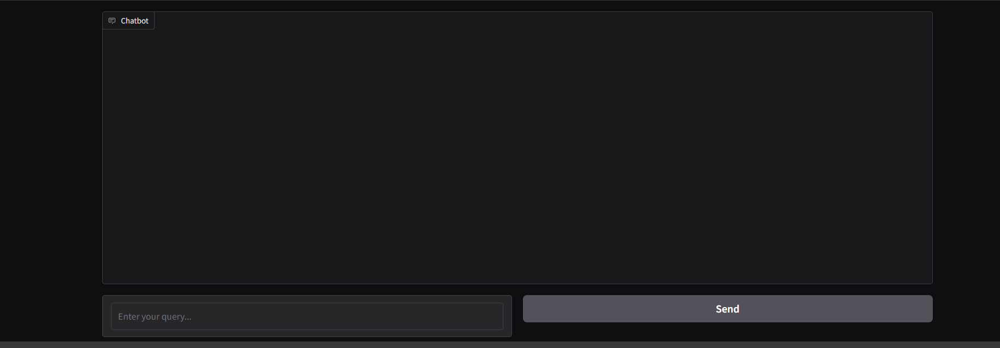

Sample output

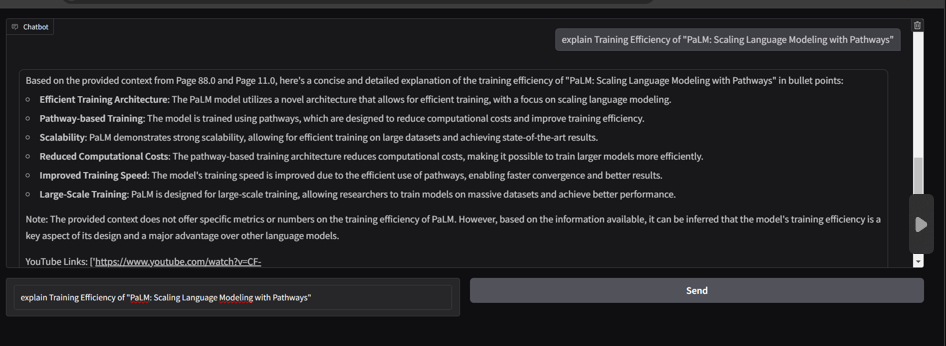